# Exploratory cerium plots with base MWM DR19 data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy import stats

import paths
from utils import get_color_list
from mwm_sample import abundance_ratio

In [2]:
plt.style.use(paths.styles / 'notebook.mplstyle')

In [3]:
mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')
mwm_rgb

/var/folders/_s/lknhlnjn1g1cj388brpgztf80000gn/T/ipykernel_1368/610113364.py:1: DtypeWarning: Columns (44) have mixed types. Specify dtype option on import or set low_memory=False.
  mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')



,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,c_n,e_c_n,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz
0,54381291,NaN,421495278551818624,421495278551818624,403218924,16384,tic_v8,25,27021597850714872,4291430952,...,-0.256311,0.024055,12.439019,153.313414,-0.663968,12.222205,0.703732,0.014642,-25272.458243,2564.722834
1,54381397,NaN,421505552113500800,421505552113500800,369831391,16384,tic_v8,25,27021597850723334,4291439436,...,-0.198570,0.024895,10.447799,161.379103,-0.379658,10.506503,0.506564,0.143261,-30486.022363,2245.499245
2,54381405,NaN,421506067509558016,421506067510359808,369831290,16384,tic_v8,25,27021597850724078,4291440182,...,-0.332730,0.018693,10.274266,162.308315,-0.351110,8.760375,0.532926,0.224887,-36536.627138,1911.999891
3,54381758,2M00204981+5625073,421540152367477248,421540152367477248,403307163,16385,gaia_dr3_source,31,63050394783216344,4291448641,...,-0.236124,0.024095,12.096207,154.781406,-0.610219,11.985890,1.989756,0.028805,-25026.240407,2521.123098
4,54381959,2M00224114+5636475,421557607115380608,421557607115380608,403393455,16025,gaia_dr3_source,31,63050394783222145,4291878516,...,-0.371770,0.015182,9.110510,170.227131,-0.163923,8.566006,0.227114,0.170685,-38634.632478,1874.115098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178300,129060878,2M11484212-6220219,5334808943135705600,5334808943135705600,324668848,185355,gaia_dr3_source,31,63050395882762275,5762936654,...,-0.430750,0.023164,7.492782,-141.850596,-0.016213,6.137214,0.027250,0.189417,-53346.952200,1379.630757
178301,129060884,2M09110058-4849577,5326021096449688064,5326021096449688064,364057991,172356,gaia_dr3_source,31,63050395875982757,5802300216,...,-0.322500,0.020773,9.207778,-151.641683,-0.014818,5.354831,0.043301,0.432860,-51779.280078,1208.103473
178302,129060885,2M08333243-3911278,5529360241405866752,5529360241405866752,185021879,160694,gaia_dr3_source,31,63050395950945615,5800869040,...,-0.341250,0.023480,9.899075,-154.976288,0.061825,8.439482,0.310362,0.169676,-39217.032992,1849.352832
178303,129060909,2M13582184-6202236,5866253799616922112,5866253799616922112,325588166,185382,gaia_dr3_source,31,63050396108514375,5632820971,...,-0.577520,0.020591,6.623241,-160.900700,0.007032,7.240775,0.014861,0.100803,-46906.742932,1610.019725


In [4]:
mwm_rgb['ce_fe'], mwm_rgb['e_ce_fe'] = abundance_ratio(mwm_rgb, 'ce', 'fe')
mwm_rgb

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz,ce_fe,e_ce_fe
0,54381291,NaN,421495278551818624,421495278551818624,403218924,16384,tic_v8,25,27021597850714872,4291430952,...,12.439019,153.313414,-0.663968,12.222205,0.703732,0.014642,-25272.458243,2564.722834,0.097161,0.048916
1,54381397,NaN,421505552113500800,421505552113500800,369831391,16384,tic_v8,25,27021597850723334,4291439436,...,10.447799,161.379103,-0.379658,10.506503,0.506564,0.143261,-30486.022363,2245.499245,0.211740,0.049026
2,54381405,NaN,421506067509558016,421506067510359808,369831290,16384,tic_v8,25,27021597850724078,4291440182,...,10.274266,162.308315,-0.351110,8.760375,0.532926,0.224887,-36536.627138,1911.999891,0.303631,0.047972
3,54381758,2M00204981+5625073,421540152367477248,421540152367477248,403307163,16385,gaia_dr3_source,31,63050394783216344,4291448641,...,12.096207,154.781406,-0.610219,11.985890,1.989756,0.028805,-25026.240407,2521.123098,0.026801,0.048889
4,54381959,2M00224114+5636475,421557607115380608,421557607115380608,403393455,16025,gaia_dr3_source,31,63050394783222145,4291878516,...,9.110510,170.227131,-0.163923,8.566006,0.227114,0.170685,-38634.632478,1874.115098,0.269971,0.047635
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178300,129060878,2M11484212-6220219,5334808943135705600,5334808943135705600,324668848,185355,gaia_dr3_source,31,63050395882762275,5762936654,...,7.492782,-141.850596,-0.016213,6.137214,0.027250,0.189417,-53346.952200,1379.630757,0.057346,0.048814
178301,129060884,2M09110058-4849577,5326021096449688064,5326021096449688064,364057991,172356,gaia_dr3_source,31,63050395875982757,5802300216,...,9.207778,-151.641683,-0.014818,5.354831,0.043301,0.432860,-51779.280078,1208.103473,0.243421,0.048431
178302,129060885,2M08333243-3911278,5529360241405866752,5529360241405866752,185021879,160694,gaia_dr3_source,31,63050395950945615,5800869040,...,9.899075,-154.976288,0.061825,8.439482,0.310362,0.169676,-39217.032992,1849.352832,0.179331,0.048814
178303,129060909,2M13582184-6202236,5866253799616922112,5866253799616922112,325588166,185382,gaia_dr3_source,31,63050396108514375,5632820971,...,6.623241,-160.900700,0.007032,7.240775,0.014861,0.100803,-46906.742932,1610.019725,0.011881,0.048341


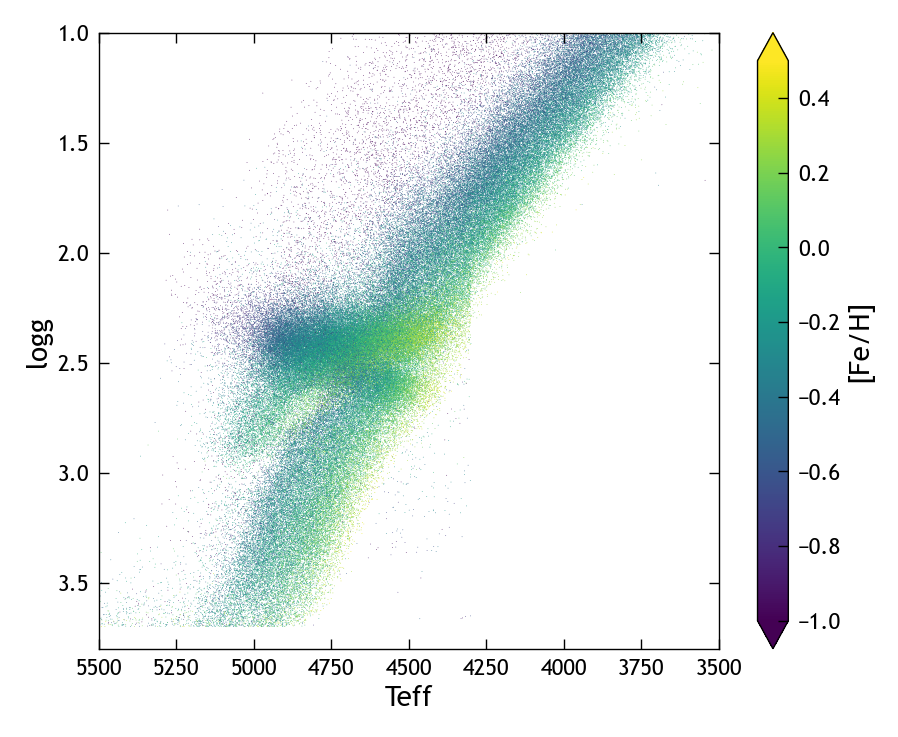

In [5]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['fe_h'], vmin=-1, vmax=0.5, **kwargs)
fig.colorbar(pc, ax=ax, label='[Fe/H]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

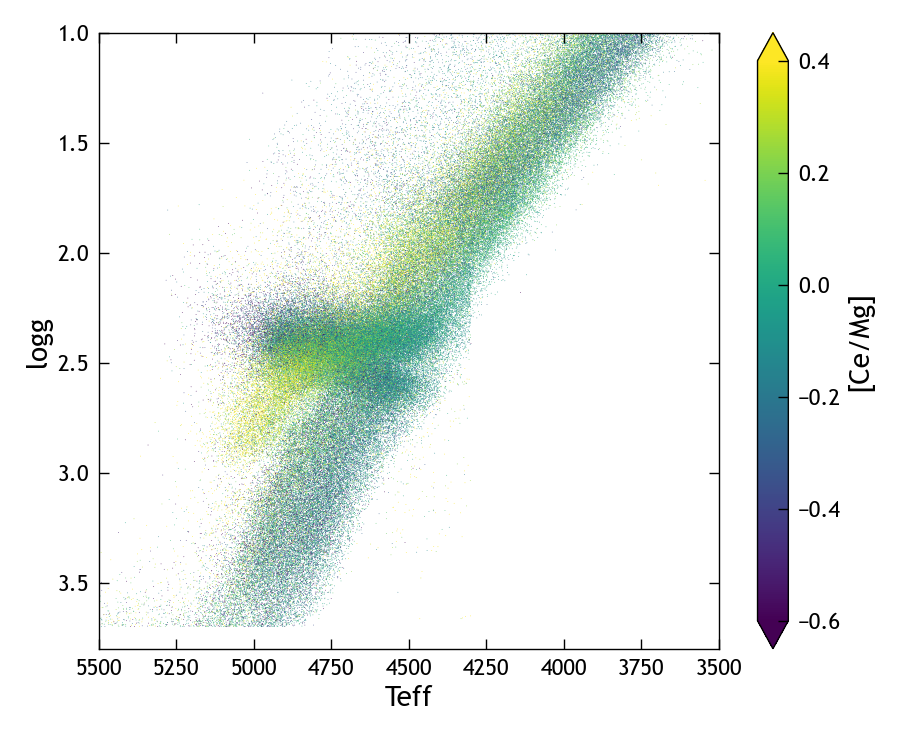

In [6]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['ce_mg'], vmin=-0.6, vmax=0.4, **kwargs)
fig.colorbar(pc, ax=ax, label='[Ce/Mg]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

## Solar Neighborhood

In [7]:
mwm_rgb_local = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 2)
]
mwm_rgb_local

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,...,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz,ce_fe,e_ce_fe
5,54381962,NaN,421557744554456064,421557744554456064,403393481,16025,tic_v8,25,27021597851161095,4291878605,...,8.749783,173.281551,-0.101791,9.203993,0.110773,0.056668,-36782.995717,1997.815531,0.239731,0.048096
19,54382295,NaN,421589183715747968,421589183715747968,327577724,16024,tic_v8,25,27021597850733418,4291449550,...,8.960581,171.306019,-0.140909,9.149293,0.271906,0.090468,-36733.511600,1987.280037,0.177620,0.051042
27,54382700,2M00200721+5700122,421625909974353280,421625914277199872,406762101,15668,gaia_dr3_source,31,63050394783245110,4291624784,...,8.711216,173.559819,-0.087171,7.993401,0.222569,0.090786,-42495.998512,1761.353614,0.219099,0.047857
60,54383757,2M00290801+5640111,421706109904337024,421706109904337024,320047050,16027,gaia_dr3_source,31,63050394783273185,4291910754,...,8.849934,172.602995,-0.117191,9.054247,0.156097,0.105772,-37114.362010,1968.943847,0.021089,0.047683
73,54384509,2M00271056+5654556,421762352496488832,421762352496488832,319844954,15670,gaia_dr3_source,31,63050394783292573,4291900981,...,8.980030,171.457401,-0.133094,8.774935,0.174333,0.079248,-38625.480164,1914.830501,0.194379,0.047774
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
178281,129060702,2M09103407-4845571,5326025391417031552,5326025391417031552,355665042,172356,gaia_dr3_source,31,63050395875983927,5802300960,...,8.821773,-156.871530,-0.007860,8.416697,0.778830,0.092237,-39628.833056,1844.884656,0.232956,0.049357
178287,129060768,2M09150089-4756448,5326450696258684032,5326450696258684032,461741387,171468,gaia_dr3_source,31,63050395876069826,5802236276,...,8.945117,-155.159136,0.061898,11.802998,0.147239,0.497218,-16248.146208,2487.306990,0.039286,0.048835
178289,129060777,2M09120875-4832413,5326054081799907712,5326054081799907712,372916511,171914,gaia_dr3_source,31,63050395875989157,5802232075,...,8.880072,-155.981804,0.012429,10.136504,0.136603,0.164499,-31834.447634,2175.703160,0.120101,0.048813
178298,129060864,2M09093978-4751104,5326886175877017088,5326886175877017088,74380758,171016,gaia_dr3_source,31,63050395876148699,5802260041,...,8.763567,-158.548094,0.023036,9.193273,0.050513,0.144406,-36105.690536,1995.751915,0.263877,0.049065


In [8]:
def alpha_cut(feh):
    """Returns [Mg/Fe] cut as function of [Fe/H]."""
    return np.where(
        feh >= 0.0,
        0.1,
        0.1 - 0.13*feh
    )

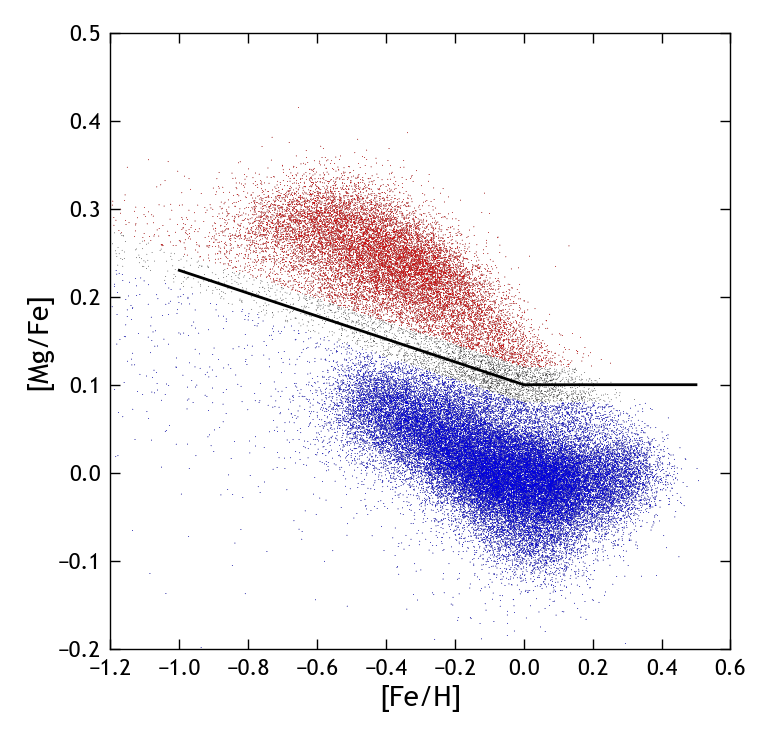

In [9]:
ms = 0.3

fig, ax = plt.subplots()
ax.scatter(
    mwm_rgb_local['fe_h'], mwm_rgb_local['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='k'
)
feh_arr = np.arange(-1., 0.51, 0.1)
ax.plot(feh_arr, alpha_cut(feh_arr), c='k')
# high-alpha
alpha_buffer = 0.02
local_high_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] > alpha_cut(mwm_rgb_local['fe_h']) + alpha_buffer
]
ax.scatter(
    local_high_alpha['fe_h'], local_high_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='r'
)
# low-alpha
local_low_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] < alpha_cut(mwm_rgb_local['fe_h']) - alpha_buffer
]
ax.scatter(
    local_low_alpha['fe_h'], local_low_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='b'
)
ax.set_xlabel('[Fe/H]')
ax.set_ylabel('[Mg/Fe]')
ax.set_xlim((-1.2, 0.6))
ax.set_ylim((-0.2, 0.5))
plt.show()

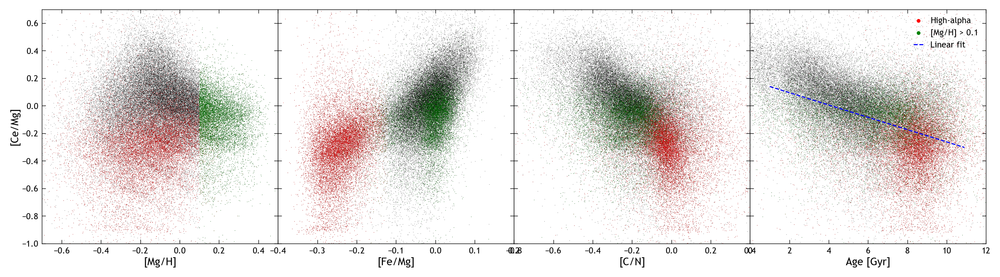

In [14]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

# Full sample
axs[0].scatter(mwm_rgb_local['mg_h'], mwm_rgb_local['ce_mg'], c='k', **kwargs)
axs[1].scatter(-mwm_rgb_local['mg_fe'], mwm_rgb_local['ce_mg'], c='k', **kwargs)
axs[2].scatter(mwm_rgb_local['c_n'], mwm_rgb_local['ce_mg'], c='k', **kwargs)
axs[3].scatter(mwm_rgb_local['age'], mwm_rgb_local['ce_mg'], c='k', **kwargs)

# High-alpha
axs[0].scatter(local_high_alpha['mg_h'], local_high_alpha['ce_mg'], c='r', **kwargs)
axs[1].scatter(-local_high_alpha['mg_fe'], local_high_alpha['ce_mg'], c='r', **kwargs)
axs[2].scatter(local_high_alpha['c_n'], local_high_alpha['ce_mg'], c='r', **kwargs)
axs[3].scatter(local_high_alpha['age'], local_high_alpha['ce_mg'], c='r', **kwargs, label='High-alpha')

# Local metal-rich
local_metal_rich = mwm_rgb_local[mwm_rgb_local['mg_h'] > 0.1]
axs[0].scatter(local_metal_rich['mg_h'], local_metal_rich['ce_mg'], c='g', **kwargs)
axs[1].scatter(-local_metal_rich['mg_fe'], local_metal_rich['ce_mg'], c='g', **kwargs)
axs[2].scatter(local_metal_rich['c_n'], local_metal_rich['ce_mg'], c='g', **kwargs)
axs[3].scatter(local_metal_rich['age'], local_metal_rich['ce_mg'], c='g', **kwargs, label='[Mg/H] > 0.1')

# [C/N] linear regression
age_linreg = stats.linregress(mwm_rgb_local['age'], mwm_rgb_local['ce_mg'], 
                              nan_policy='omit')
xarr = np.arange(1, 11, 0.1)
axs[3].plot(xarr, age_linreg.intercept + age_linreg.slope * xarr, 'b--',
            label='Linear fit')

axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Fe/Mg]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-1, 0.7))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.4, 0.2))
axs[2].set_xlim((-0.8, 0.4))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

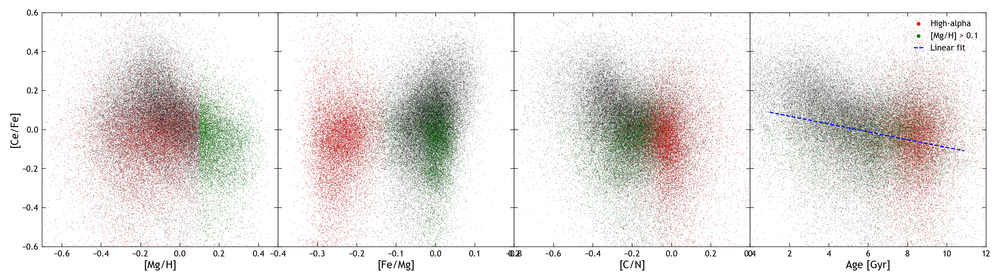

In [20]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

# Full sample
axs[0].scatter(mwm_rgb_local['mg_h'], mwm_rgb_local['ce_fe'], c='k', **kwargs)
axs[1].scatter(-mwm_rgb_local['mg_fe'], mwm_rgb_local['ce_fe'], c='k', **kwargs)
axs[2].scatter(mwm_rgb_local['c_n'], mwm_rgb_local['ce_fe'], c='k', **kwargs)
axs[3].scatter(mwm_rgb_local['age'], mwm_rgb_local['ce_fe'], c='k', **kwargs)

# High-alpha
axs[0].scatter(local_high_alpha['mg_h'], local_high_alpha['ce_fe'], c='r', **kwargs)
axs[1].scatter(-local_high_alpha['mg_fe'], local_high_alpha['ce_fe'], c='r', **kwargs)
axs[2].scatter(local_high_alpha['c_n'], local_high_alpha['ce_fe'], c='r', **kwargs)
axs[3].scatter(local_high_alpha['age'], local_high_alpha['ce_fe'], c='r', **kwargs, label='High-alpha')

# Local metal-rich
local_metal_rich = mwm_rgb_local[mwm_rgb_local['mg_h'] > 0.1]
axs[0].scatter(local_metal_rich['mg_h'], local_metal_rich['ce_fe'], c='g', **kwargs)
axs[1].scatter(-local_metal_rich['mg_fe'], local_metal_rich['ce_fe'], c='g', **kwargs)
axs[2].scatter(local_metal_rich['c_n'], local_metal_rich['ce_fe'], c='g', **kwargs)
axs[3].scatter(local_metal_rich['age'], local_metal_rich['ce_fe'], c='g', **kwargs, label='[Mg/H] > 0.1')

# [C/N] linear regression
age_linreg = stats.linregress(mwm_rgb_local['age'], mwm_rgb_local['ce_fe'], 
                              nan_policy='omit')
xarr = np.arange(1, 11, 0.1)
axs[3].plot(xarr, age_linreg.intercept + age_linreg.slope * xarr, 'b--',
            label='Linear fit')

axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Fe/Mg]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-0.6, 0.6))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.4, 0.2))
axs[2].set_xlim((-0.8, 0.4))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

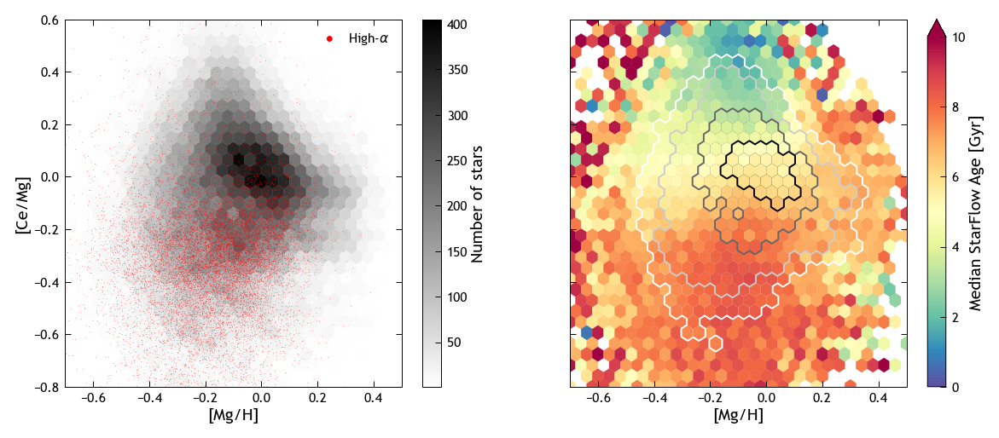

In [23]:
gridsize = 30
xlim = (-0.7, 0.5)
ylim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['mg_h'], mwm_rgb_local['ce_mg'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['mg_h'], local_high_alpha['ce_mg'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['mg_h'], 
    y=mwm_rgb_local['ce_mg'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/H]')
axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

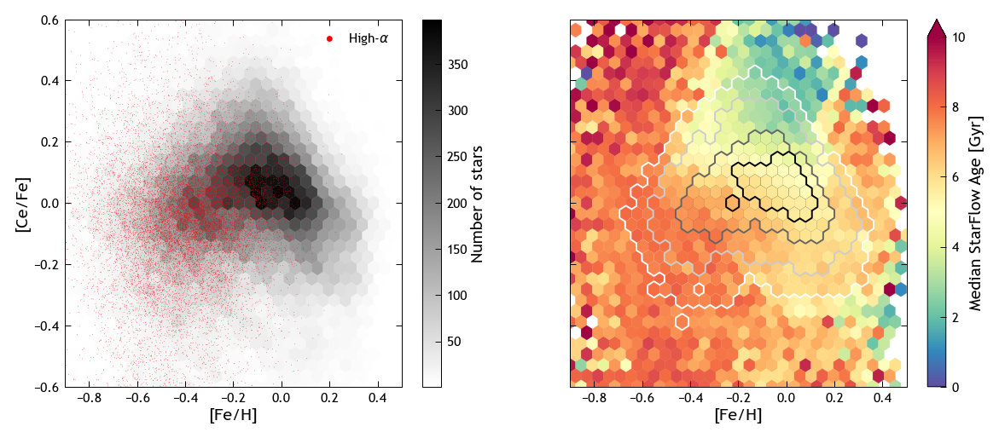

In [22]:
gridsize = 30
xlim = (-0.9, 0.5)
ylim = (-0.6, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['fe_h'], mwm_rgb_local['ce_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['fe_h'], local_high_alpha['ce_fe'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['fe_h'], 
    y=mwm_rgb_local['ce_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Fe/H]')
axs[1].set_xlabel('[Fe/H]')
axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

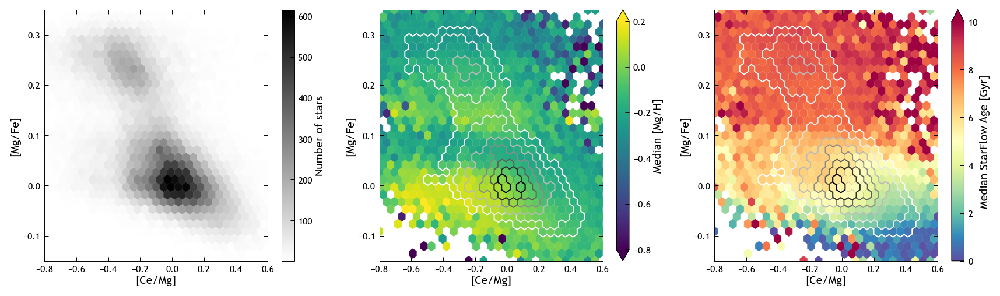

In [26]:
gridsize = 30
ylim = (-0.15, 0.35)
xlim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 3, figsize=(15, 4), dpi=140, sharex=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['ce_mg'], mwm_rgb_local['mg_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')

# Color by metallicity
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['mg_h'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='viridis',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=-0.8, vmax=0.2)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300, 400, 500, 600]
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='both')
cbar.ax.set_ylabel('Median [Mg/H]')

# Color by median [C/N]
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[2].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[2].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[2].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[2], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Ce/Mg]')
axs[1].set_xlabel('[Ce/Mg]')
axs[2].set_xlabel('[Ce/Mg]')
axs[0].set_ylabel('[Mg/Fe]')
axs[1].set_ylabel('[Mg/Fe]')
axs[2].set_ylabel('[Mg/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
axs[1].set_ylim(ylim)
axs[2].set_ylim(ylim)
plt.show()

## Across the disk

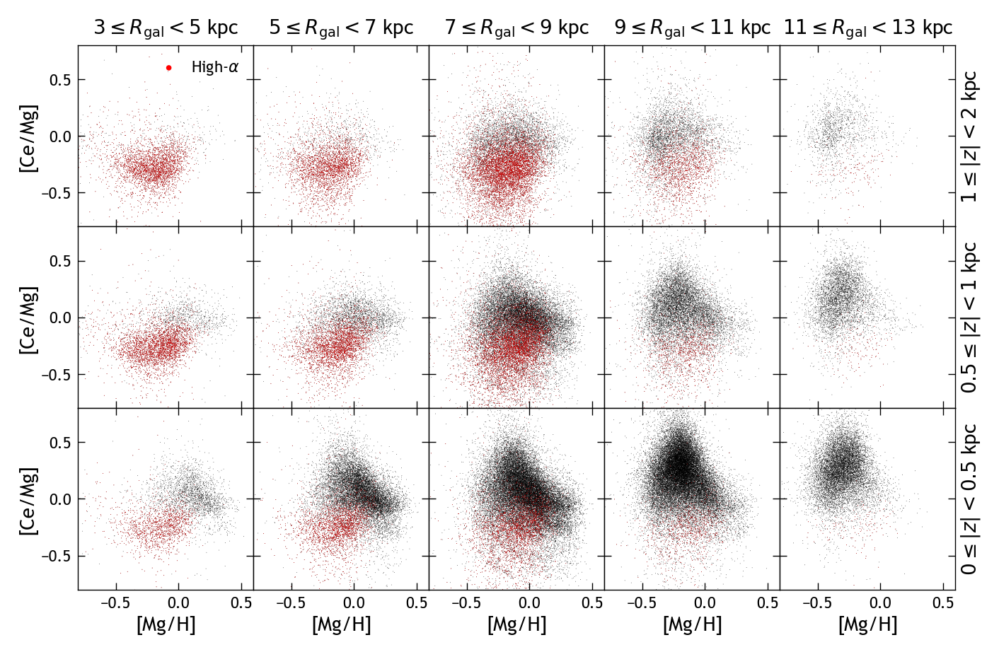

In [78]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['mg_h'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        ax.scatter(high_alpha['mg_h'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

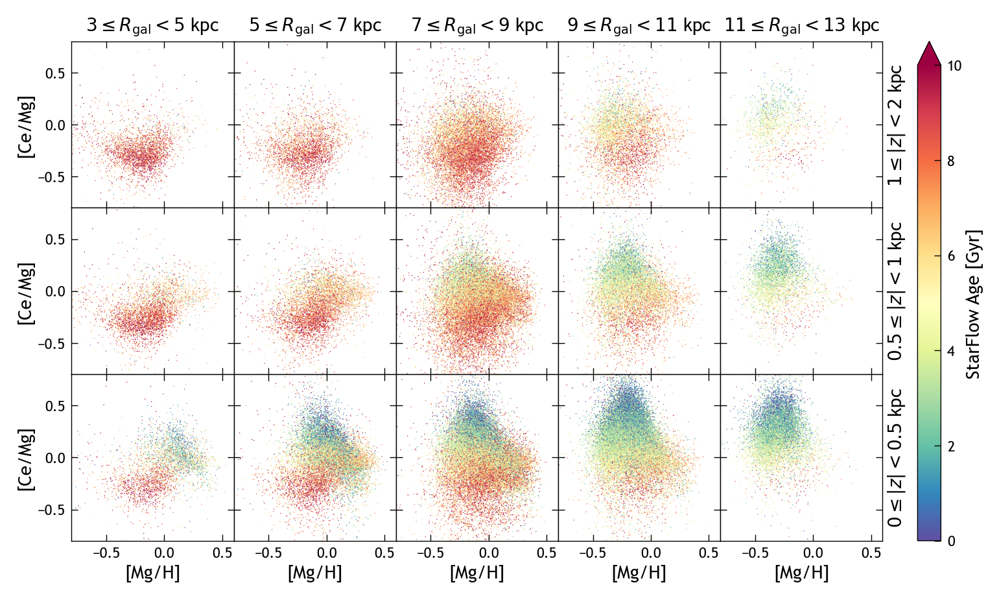

In [27]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=1, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(9, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        pc = ax.scatter(subset['mg_h'], subset['ce_mg'], c=subset['age'], 
                   vmin=0, vmax=10, cmap='Spectral_r', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))

# Colorbar
width = 0.02
pad = 0.03
plt.subplots_adjust(right=fig.subplotpars.right - (width + pad + 0.03))
height = fig.subplotpars.top - fig.subplotpars.bottom
cax = plt.axes([fig.subplotpars.right + pad, fig.subplotpars.bottom, 
                width, height])
fig.colorbar(pc, cax=cax, extend='max', label='StarFlow Age [Gyr]')

plt.show()

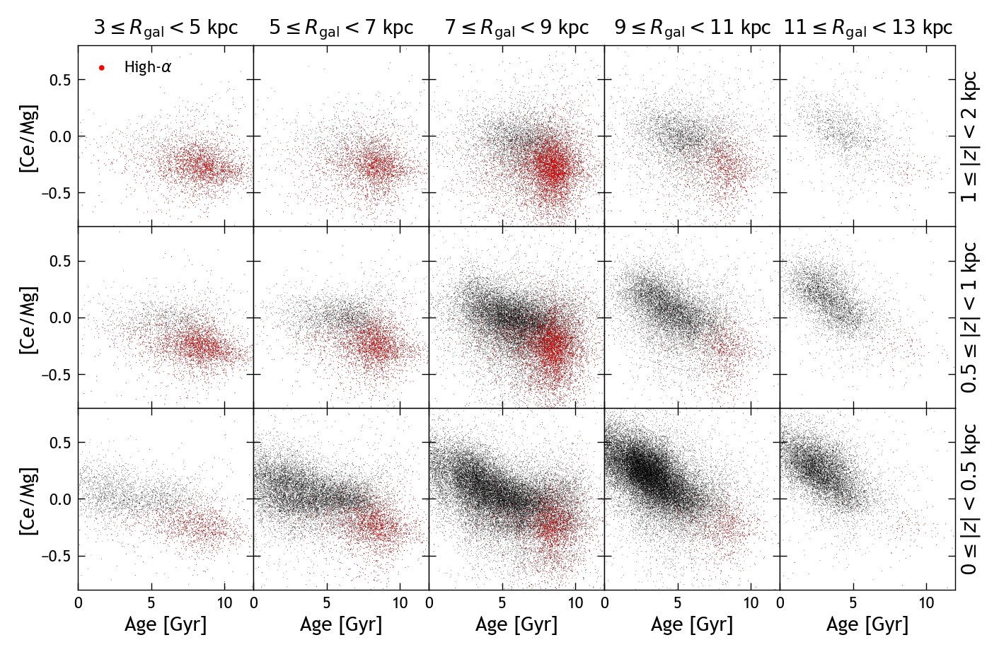

In [28]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['age'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        ax.scatter(high_alpha['age'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

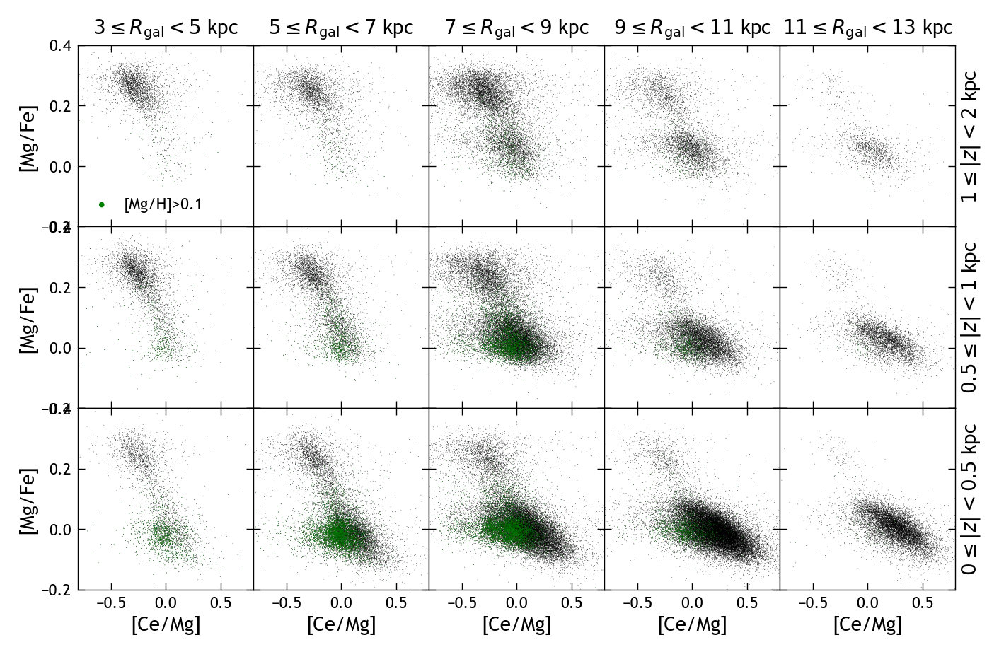

In [30]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0}
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['ce_mg'], subset['mg_fe'], c='k', **kwargs)
        # high_alpha = subset[
        #     subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        # ]
        # ax.scatter(high_alpha['ce_mg'], high_alpha['mg_fe'], c='r', 
        #            label=r'High-$\alpha$', **kwargs)
        metal_rich = subset[subset['mg_h'] > 0.1]
        ax.scatter(metal_rich['ce_mg'], metal_rich['mg_fe'], c='g',
                   label='[Mg/H]>0.1', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.8))
axs[0,0].set_ylim((-0.2, 0.4))
for ax in axs[-1,:]:
    ax.set_xlabel('[Ce/Mg]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Mg/Fe]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()